In [57]:
# unicode, regex, json for text digestion
import unicodedata
import re
import json
from wordcloud import WordCloud

import seaborn as sns
import matplotlib.pyplot as plt

# nltk: natural language toolkit -> tokenization, stopwords (more on this soon)
import nltk
from nltk.tokenize.toktok import ToktokTokenizer
from nltk.corpus import stopwords

from prepare import *


# pandas dataframe manipulation, acquire script, time formatting
import pandas as pd
from time import strftime

# shh, down in front
import warnings
warnings.filterwarnings('ignore')

In [58]:
df = pd.read_json('data.json')

In [59]:
df = prep_repos(df)

In [60]:
df

,repo,language,original,clean,stemmed,lemmatized,language_reduced
0,google/googletest,C++,# GoogleTest\n\n### Announcements\n\n#### Live...,googletest announcements live head googletest ...,googletest announc live head googletest follow...,googletest announcement live head googletest f...,Other
1,projectdiscovery/nuclei-templates,Python,"\n\n<h1 align=""center"">\nNuclei Templates\n</h...",h1 aligncenter nuclei templates h1 h4 aligncen...,h1 aligncent nuclei templat h1 h4 aligncenterc...,h1 aligncenter nucleus template h1 h4 aligncen...,Python
2,digitalocean/nginxconfig.io,JavaScript,[![GitHub stars](https://img.shields.io/github...,github stars https imgshieldsio github stars d...,github star http imgshieldsio github star digi...,github star http imgshieldsio github star digi...,JavaScript
3,flutter/flutter,Dart,# [![Flutter logo][]][flutter.dev]\n\n[![Build...,flutter logo flutterdev build status cirrus bu...,flutter logo flutterdev build statu cirru buil...,flutter logo flutterdev build status cirrus bu...,Other
4,PaddlePaddle/PaddleOCR,Python,"English | [简体中文](README_ch.md)\n\n<p align=""ce...",english readmechmd p aligncenter img src doc p...,english readmechmd p aligncent img src doc pad...,english readmechmd p aligncenter img src doc p...,Python
...,...,...,...,...,...,...,...
110,cloudflare/cloudflare.github.io,CSS,cloudflare.github.io\n====================\n\n...,cloudflaregithubio source code https cloudflar...,cloudflaregithubio sourc code http cloudflareg...,cloudflaregithubio source code http cloudflare...,Other
111,eleme/eleme.github.io,CSS,# Team Blog\n\nRequirements to join this blog:...,team blog requirements join blog 1 must develo...,team blog requir join blog 1 must develop elem...,team blog requirement join blog 1 must develop...,Other
112,didi/didi.github.io,HTML,# didi.github.io\ndidi website\n,didigithubio didi website,didigithubio didi websit,didigithubio didi website,HTML
113,alibaba/alibaba.github.com,CSS,,,,,Other


In [61]:
df[df.language.isna()]

,repo,language,original,clean,stemmed,lemmatized,language_reduced
6,felipefialho/frontend-challenges,None,"<p align=""center""><img src=""https://user-image...",p aligncenterimg srchttps userimagesgithubuser...,p aligncenterimg srchttp userimagesgithubuserc...,p aligncenterimg srchttps userimagesgithubuser...,Other
8,florinpop17/app-ideas,None,## :ledger: App Ideas Collection\n\n![App Idea...,ledger app ideas collection app ideas image ap...,ledger app idea collect app idea imag appideas...,ledger app idea collection app idea image appi...,Other
21,ACM-Alexandria-SC/Internships,None,\n\n\n\n# Summer 2022 Tech Internships for Egy...,summer 2022 tech internships egyptian students...,summer 2022 tech internship egyptian student c...,summer 2022 tech internship egyptian student c...,Other
37,onceupon/Bash-Oneliner,None,# Bash-Oneliner\nI am glad that you are here! ...,bashoneliner glad working bioinformatics years...,bashonelin glad work bioinformat year ago amaz...,bashoneliner glad working bioinformatics year ...,Other
80,datasciencemasters/go,None,_created & maintained by [@clarecorthell](http...,created maintained clarecorthell http bitly cl...,creat maintain clarecorthel http bitli clareco...,created maintained clarecorthell http bitly cl...,Other
81,practical-tutorials/project-based-learning,None,# Project Based Learning\n\n[![Gitter](https:/...,project based learning gitter https badgesgitt...,project base learn gitter http badgesgitterim ...,project based learning gitter http badgesgitte...,Other
82,zhiwehu/Python-programming-exercises,None,# Python-programming-exercises\n\n100+ Python ...,pythonprogrammingexercises 100 python challeng...,pythonprogrammingexercis 100 python challeng p...,pythonprogrammingexercises 100 python challeng...,Other
83,MunGell/awesome-for-beginners,None,[![Doppler](assets/doppler.png)](https://www.d...,doppler assets dopplerpng https wwwdopplercom ...,doppler asset dopplerpng http wwwdopplercom ut...,doppler asset dopplerpng http wwwdopplercom ut...,Other
84,appacademy/welcome-to-open,None,# Welcome to a/A Open\n\n![](open-image.png)\n...,welcome open openimagepng tldr click learn cod...,welcom open openimagepng tldr click learn code...,welcome open openimagepng tldr click learn cod...,Other
90,karan/Projects,None,Mega Project List\r\n========\r\n\r\nA list of...,mega project list list practical projects anyo...,mega project list list practic project anyon s...,mega project list list practical project anyon...,Other


In [62]:
df[df.original == ""]

,repo,language,original,clean,stemmed,lemmatized,language_reduced
36,NvChad/NvChad,Lua,,,,,Other
109,godaddy/godaddy.github.io,HTML,,,,,HTML
113,alibaba/alibaba.github.com,CSS,,,,,Other
114,google/google.github.io,HTML,,,,,HTML


In [63]:
df['language_reduced'] = df.language.apply(lambda lang: lang if lang in ['JavaScript', 'HTML', 'Python'] else 'Other')

In [64]:
df.language.value_counts()

Python              15
JavaScript          15
TypeScript          10
HTML                10
CSS                  8
Rust                 7
Go                   5
Jupyter Notebook     4
SCSS                 3
C#                   3
Java                 3
Shell                2
Ruby                 2
C++                  2
C                    2
Dart                 2
Lua                  1
PHP                  1
Julia                1
Swift                1
PowerShell           1
V                    1
Vim script           1
Assembly             1
Vue                  1
SWIG                 1
Name: language, dtype: int64

In [65]:
df.language.value_counts(normalize=True)

Python              0.145631
JavaScript          0.145631
TypeScript          0.097087
HTML                0.097087
CSS                 0.077670
Rust                0.067961
Go                  0.048544
Jupyter Notebook    0.038835
SCSS                0.029126
C#                  0.029126
Java                0.029126
Shell               0.019417
Ruby                0.019417
C++                 0.019417
C                   0.019417
Dart                0.019417
Lua                 0.009709
PHP                 0.009709
Julia               0.009709
Swift               0.009709
PowerShell          0.009709
V                   0.009709
Vim script          0.009709
Assembly            0.009709
Vue                 0.009709
SWIG                0.009709
Name: language, dtype: float64

In [66]:
df.language_reduced.value_counts(normalize=True)

Other         0.652174
Python        0.130435
JavaScript    0.130435
HTML          0.086957
Name: language_reduced, dtype: float64

In [67]:
py_words = ' '.join(df[df.language == 'Python'].clean)
java_words = ' '.join(df[df.language == 'JavaScript'].clean)
html_words = ' '.join(df[df.language == 'HTML'].clean)
types_words = ' '.join(df[df.language == 'TypeScript'].clean)
css_words = ' '.join(df[df.language == 'CSS'].clean)
all_words = ' '.join(df.clean)


In [68]:
py_words[:1000]

'h1 aligncenter nuclei templates h1 h4 aligncentercommunity curated list templates nuclei engine find security vulnerabilities applications h4 p aligncenter hrefhttps githubcom projectdiscovery nucleitemplates issuesimg srchttps imgshieldsio badge contributionswelcomebrightgreensvgstyleflat hrefhttps githubcom projectdiscovery nucleitemplates releasesimg srchttps imgshieldsio github release projectdiscovery nucleitemplates hrefhttps twittercom pdnucleiimg srchttps imgshieldsio twitter follow pdnucleisvglogotwitter hrefhttps discordgg projectdiscoveryimg srchttps imgshieldsio discord 695645237418131507svglogodiscord p p aligncenter hrefhttps nucleiprojectdiscoveryio templatingguide documentation hrefcontributionscontributions hrefdiscussiondiscussion hrefcommunitycommunity hrefhttps nucleiprojectdiscoveryio faq templates faqs hrefhttps discordgg projectdiscoveryjoin discord p templates core nuclei scanner https githubcom projectdiscovery nuclei powers actual scanning engine repository s

In [69]:
java_words[:1000]

'github stars https imgshieldsio github stars digitalocean nginxconfigiosvg https githubcom digitalocean nginxconfigio stargazers github contributors https imgshieldsio github contributors digitalocean nginxconfigiosvgcolorblue https githubcom digitalocean nginxconfigio graphs contributors mit license https imgshieldsio github license digitalocean nginxconfigiosvgcolorblue https githubcom digitalocean nginxconfigio blob master license br closed issues https imgshieldsio github issuesclosedraw digitalocean nginxconfigiosvgcolorbrightgreen https githubcom digitalocean nginxconfigio issuesqis3aissueis3aclosed closed pr https imgshieldsio github issuesprclosedraw digitalocean nginxconfigiosvgcolorbrightgreen https githubcom digitalocean nginxconfigio pullsqis3apris3aclosed open issues https imgshieldsio github issuesraw digitalocean nginxconfigiosvg https githubcom digitalocean nginxconfigio issues open pr https imgshieldsio github issuesprraw digitalocean nginxconfigiosvg https githubcom 

In [70]:
html_words[:1000]

'pyscript pyscript summary pyscript pythonic alternative scratch jsfiddle easy use programming frameworks goal making web friendly hackable place anyone author interesting interactive applications get started see gettingstarted gettingstartedmd examples see pyscript folder pyscriptjs longer version pyscript meta project aims combine multiple open technologies framework allows users create sophisticated browser applications python integrates seamlessly way dom works browser allows users add python logic way feels natural web python developers try pyscript try pyscript import appropriate pyscript files html page html link relstylesheet hrefhttps pyscriptnet alpha pyscriptcss script defer srchttps pyscriptnet alpha pyscriptjs script use pyscript components html page pyscript currently implements following elements pyscript used define python code executable within web page element rendered page used add logic pyrepl creates repl component rendered page code editor allows users write execu

In [71]:
types_words[:1000]

'p aligncenter img width300 srchttps rawgithubusercontentcom supabase supabase master web static supabaselightroundedcornerbackgroundsvg p supabase supabase https supabasecom open source firebase alternative building features firebase using enterprisegrade open source tools x hosted postgres database docs https supabasecom docs guides database x authentication authorization docs https supabasecom docs guides auth x autogenerated apis x rest docs https supabasecom docs guides apirestapi x realtime subscriptions docs https supabasecom docs guides apirealtimeapi x graphql beta docs https supabasecom docs guides apigraphqlapi x functions x database functions docs https supabasecom docs guides database functions x edge functions docs https supabasecom docs guides functions x file storage docs https supabasecom docs guides storage x dashboard supabase dashboard https rawgithubusercontentcom supabase supabase master apps www public images github supabasedashboardpng documentation full documen

In [72]:
css_words[:1000]

'50 projects 50 days html css javascript main repository projects course course link https wwwudemycom course 50projects50days course info website https 50projects50dayscom project live demo 01 expanding cards https githubcom bradtraversy 50projects50days tree master expandingcards live demo https 50projects50dayscom projects expandingcards 02 progress steps https githubcom bradtraversy 50projects50days tree master progresssteps live demo https 50projects50dayscom projects progresssteps 03 rotating navigation animation https githubcom bradtraversy 50projects50days tree master rotatingnavanimation live demo https 50projects50dayscom projects rotatingnavigationanimation 04 hidden search widget https githubcom bradtraversy 50projects50days tree master hiddensearch live demo https 50projects50dayscom projects hiddensearchwidget 05 blurry loading https githubcom bradtraversy 50projects50days tree master blurryloading live demo https 50projects50dayscom projects blurryloading 06 scroll anima

In [73]:
all_words[:1000]

'googletest announcements live head googletest follows abseil live head philosophy https abseilio philosophyupgradesupport recommend updating latest commit main branch often possible https githubcom abseil abseilcpp blob master faqmdwhatisliveatheadandhowdoidoit documentation updates documentation live github pages https googlegithubio googletest recommend browsing documentation github pages rather directly repository release 1110 release 1110 https githubcom google googletest releases tag release1110 available coming soon planning take dependency abseil https githubcom abseil abseilcpp documentation improvements planned welcome googletest googles c test framework repository merger formerly separate googletest googlemock projects closely related makes sense maintain release together getting started see googletest users guide https googlegithubio googletest documentation recommend starting googletest primer https googlegithubio googletest primerhtml information building googletest found

In [74]:
py_freq = pd.Series(py_words.split()).value_counts()
java_freq = pd.Series(java_words.split()).value_counts()
html_freq = pd.Series(html_words.split()).value_counts()
types_freq = pd.Series(types_words.split()).value_counts()
css_freq = pd.Series(css_words.split()).value_counts()
all_freq = pd.Series(all_words.split()).value_counts()


In [75]:
py_freq

https                                                 2112
yes                                                   1734
unknown                                                913
details                                                855
api                                                    596
                                                      ... 
fromcachetoinmemorydatagridintroductiontohazelcast       1
redismemcached                                           1
kxtjqgepng                                               1
rgsrvjgpng                                               1
condition                                                1
Length: 9956, dtype: int64

In [76]:
java_freq

https                 322
src                   158
githubcom             130
algorithms            124
readmemd               84
                     ... 
readmecnmd              1
hiring                  1
pro                     1
forumserverlesscom      1
file2                   1
Length: 2475, dtype: int64

In [77]:
html_freq

https             70
docker            50
githubcom         47
master            37
awesomecompose    36
                  ..
give               1
purpose            1
summary            1
sophisticated      1
didi               1
Length: 610, dtype: int64

In [78]:
types_freq

https                       334
githubcom                   282
td                          265
hrefhttps                   260
appsmith                    152
                           ... 
noreferrerpostgrestkt         1
postgrestkt                   1
howtocontributedebugging      1
tdkotlin                      1
details                       1
Length: 2194, dtype: int64

In [79]:
css_freq

https         121
projects       56
githubcom      55
live           53
master         53
             ... 
popularity      1
last            1
push            1
select          1
need            1
Length: 834, dtype: int64

In [80]:
all_freq

https                  5946
githubcom              2299
yes                    1764
unknown                 914
details                 881
                       ... 
cargofeaturesmd           1
pluginsguidelinesmd       1
notfl3                    1
hecrj                     1
didi                      1
Length: 24594, dtype: int64

In [81]:
word_counts = pd.concat([py_freq, java_freq, html_freq, types_freq, css_freq, all_freq], axis=1).fillna(0).astype(int)
word_counts.columns = ['python', 'java', 'html', 'typescript', 'css', 'all']

In [82]:
word_counts.sort_values('all', ascending=False).head(25)

,python,java,html,typescript,css,all
https,2112,322,70,334,121,5946
githubcom,306,130,47,282,55,2299
yes,1734,2,0,0,0,1764
unknown,913,0,0,0,0,914
details,855,1,3,1,0,881
http,303,26,15,5,28,823
b,455,81,0,95,1,752
&#9;,25,0,0,5,1,740
api,596,16,0,21,6,724
data,376,32,0,14,8,626


In [83]:
word_counts.sort_values('python', ascending=False).head(25)

,python,java,html,typescript,css,all
https,2112,322,70,334,121,5946
yes,1734,2,0,0,0,1764
unknown,913,0,0,0,0,914
details,855,1,3,1,0,881
api,596,16,0,21,6,724
apikey,595,0,0,0,0,595
b,455,81,0,95,1,752
summarybrb,400,0,0,0,0,400
data,376,32,0,14,8,626
githubcom,306,130,47,282,55,2299


In [84]:
word_counts.sort_values('java', ascending=False).head(25)

,python,java,html,typescript,css,all
https,2112,322,70,334,121,5946
src,13,158,0,3,0,215
githubcom,306,130,47,282,55,2299
algorithms,12,124,0,2,0,153
readmemd,55,84,1,3,1,216
b,455,81,0,95,1,752
github,25,76,18,15,12,280
serverless,0,54,0,0,0,66
terrad,0,49,0,0,0,49
learn,6,41,1,101,1,229


In [85]:
word_counts.sort_values('html', ascending=False).head(25)

,python,java,html,typescript,css,all
https,2112,322,70,334,121,5946
docker,28,5,50,10,0,156
githubcom,306,130,47,282,55,2299
master,103,18,37,16,53,352
awesomecompose,0,0,36,0,0,36
tree,111,14,36,1,50,287
sample,2,2,24,2,0,33
nginx,3,12,18,0,0,37
github,25,76,18,15,12,280
http,303,26,15,5,28,823


In [86]:
word_counts.sort_values('typescript', ascending=False).head(25)

,python,java,html,typescript,css,all
https,2112,322,70,334,121,5946
githubcom,306,130,47,282,55,2299
td,52,0,0,265,0,330
hrefhttps,68,29,1,260,0,430
appsmith,0,0,0,152,0,156
br,99,13,0,128,0,535
appsmithorg,0,0,0,114,0,116
srchttps,45,10,1,108,1,236
wwwfreecodecamporg,0,0,0,103,0,105
learn,6,41,1,101,1,229


In [177]:
word_counts.sort_values('css', ascending=False).head(25)

,python,java,html,typescript,css,all
https,2112,322,70,334,121,5946
projects,13,15,3,20,56,311
githubcom,306,130,47,282,55,2299
master,103,18,37,16,53,352
live,13,1,0,2,53,79
50projects50dayscom,0,0,0,0,51,51
50projects50days,0,0,0,0,51,51
demo,4,1,0,0,51,63
tree,111,14,36,1,50,287
bradtraversy,0,0,0,0,50,50


In [88]:
# set up some basic matplotlib style parameters
plt.rc('figure', figsize=(17, 10))
plt.style.use('seaborn-darkgrid')

Text(0.5, 1.0, 'Top 25 Most Frequent Overall Words')

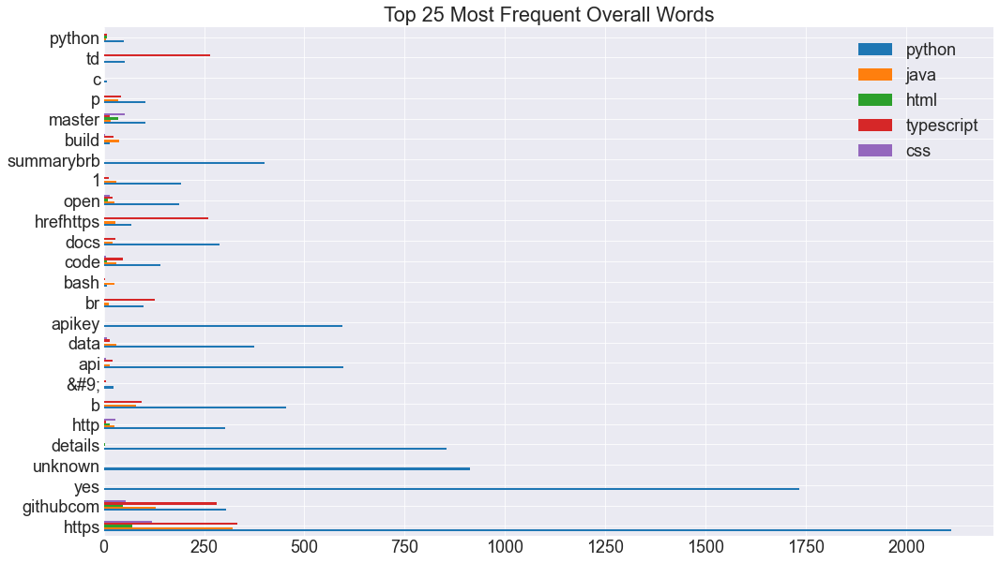

In [89]:
plt.rc('font', size=18)
word_counts.sort_values('all', ascending=False).head(25)[['python', 'java', 'html', 'typescript', 'css']].plot.barh()
plt.title('Top 25 Most Frequent Overall Words')

## Python words

<AxesSubplot:>

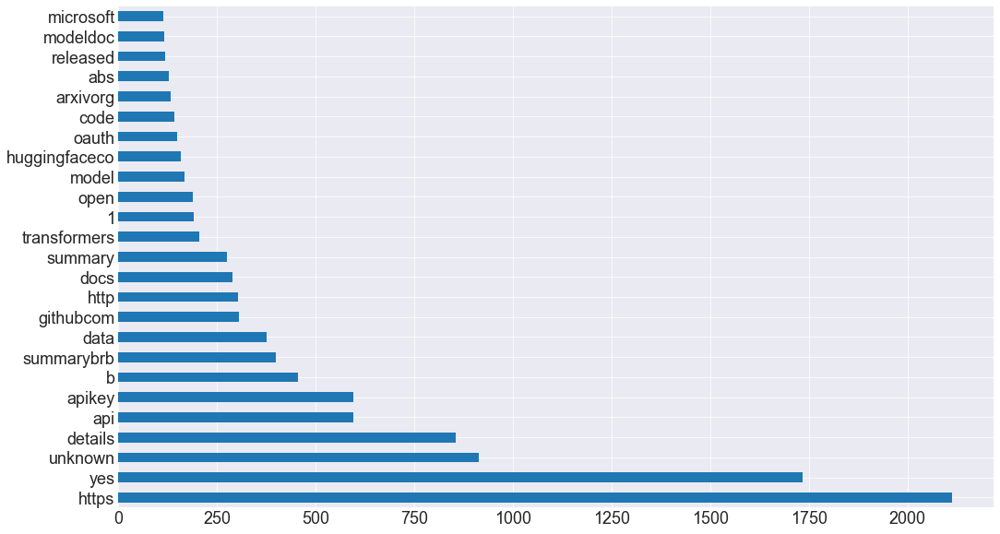

In [90]:
py_freq.head(25).plot.barh()

(-0.5, 799.5, 599.5, -0.5)

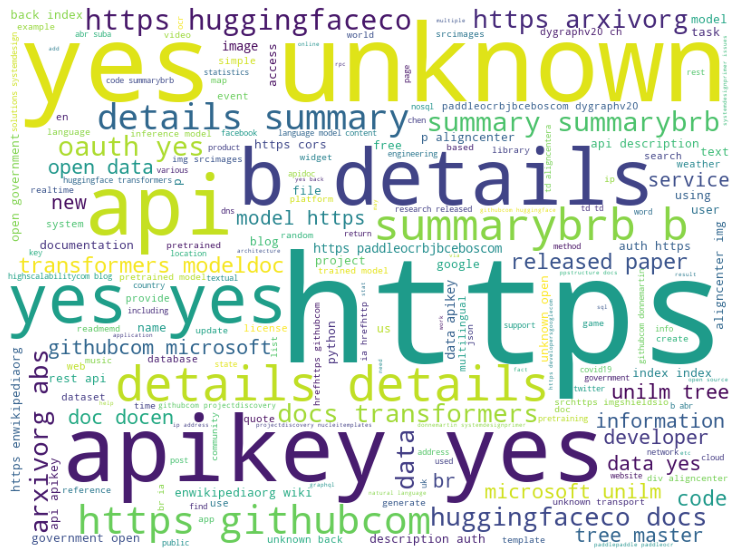

In [91]:
img = WordCloud(background_color='white', width=800, height=600).generate(py_words)
plt.imshow(img)
plt.axis('off')

(-0.5, 799.5, 599.5, -0.5)

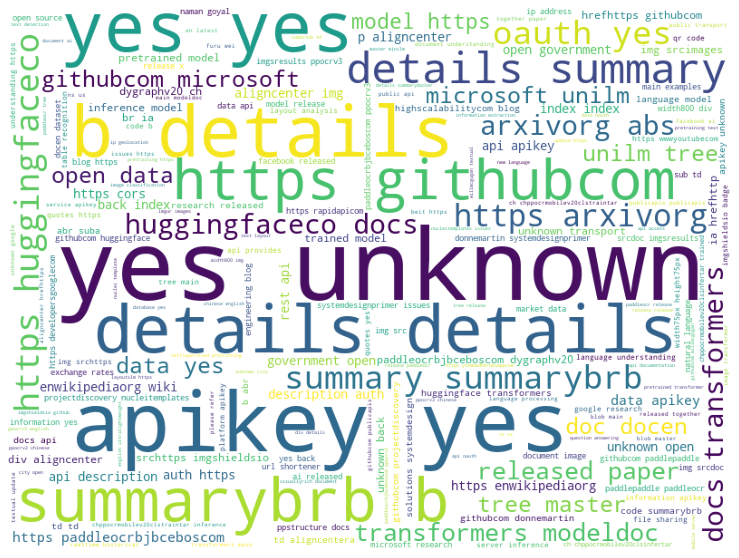

In [92]:
img = WordCloud(background_color='white', width=800, height=600, collocation_threshold=3).generate(py_words)
plt.imshow(img)
plt.axis('off')

<AxesSubplot:>

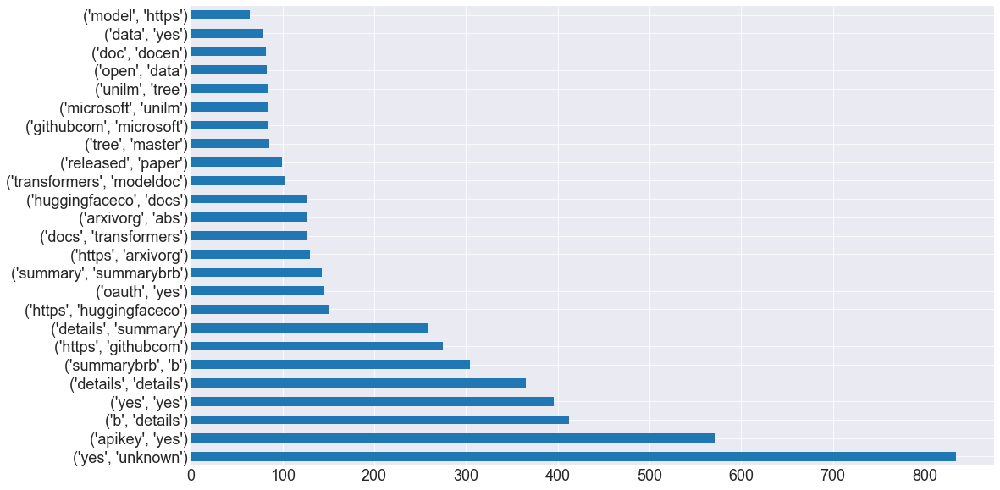

In [93]:
py_bigrams = (pd.Series((nltk.bigrams(py_words.split()))).astype('string'))
py_bigrams.value_counts().head(25).plot.barh()

## JavaScript Words

<AxesSubplot:>

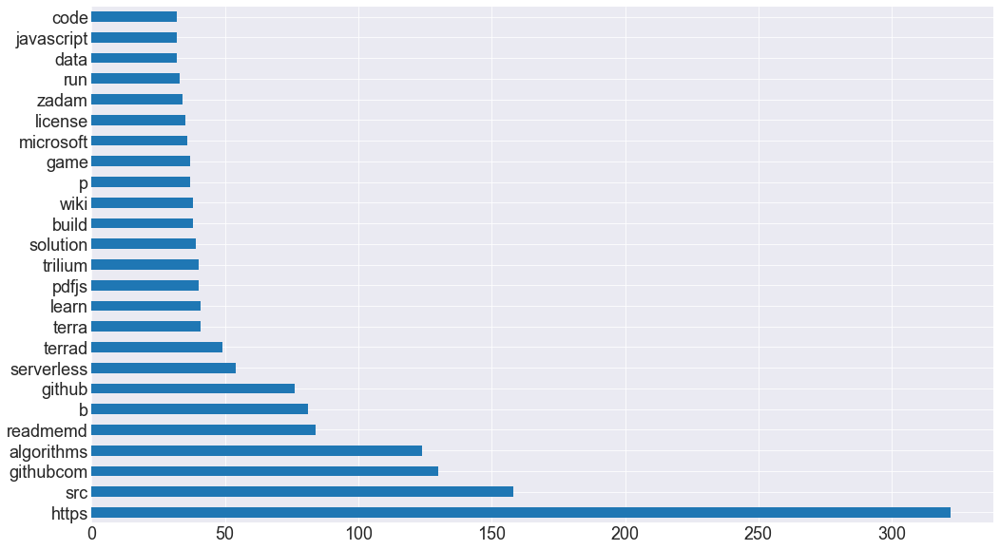

In [94]:
java_freq.head(25).plot.barh()

(-0.5, 799.5, 599.5, -0.5)

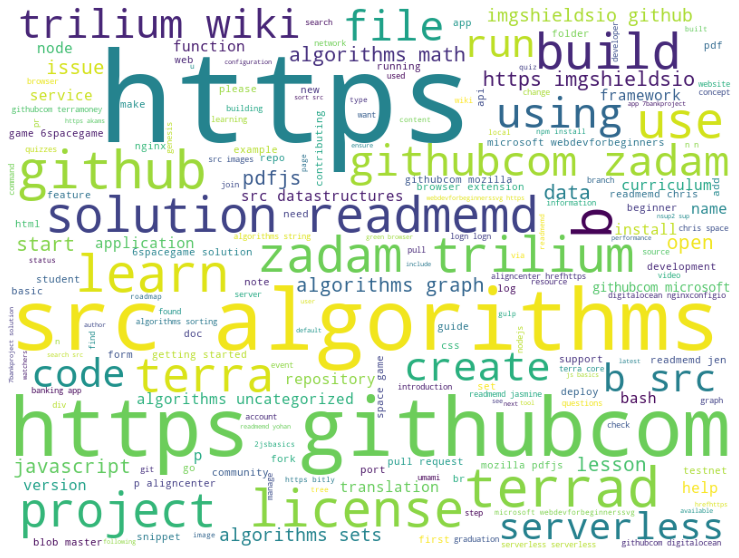

In [95]:
img = WordCloud(background_color='white', width=800, height=600).generate(java_words)
plt.imshow(img)
plt.axis('off')

(-0.5, 799.5, 599.5, -0.5)

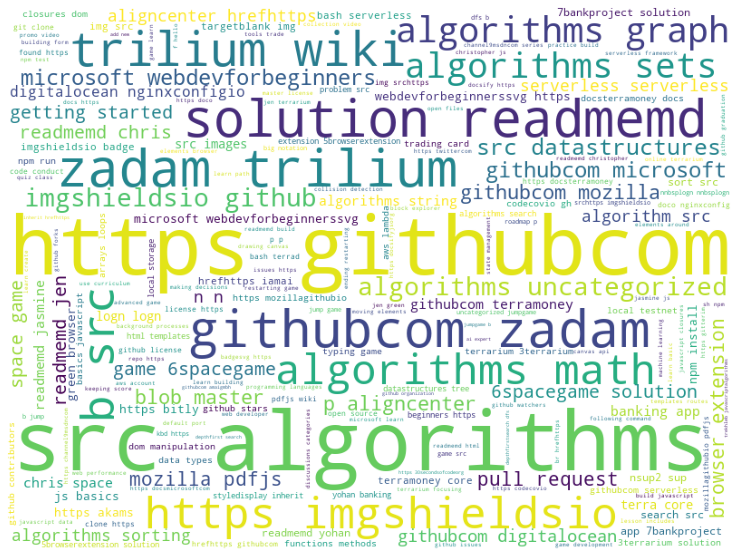

In [96]:
img = WordCloud(background_color='white', width=800, height=600, collocation_threshold=3).generate(java_words)
plt.imshow(img)
plt.axis('off')

<AxesSubplot:>

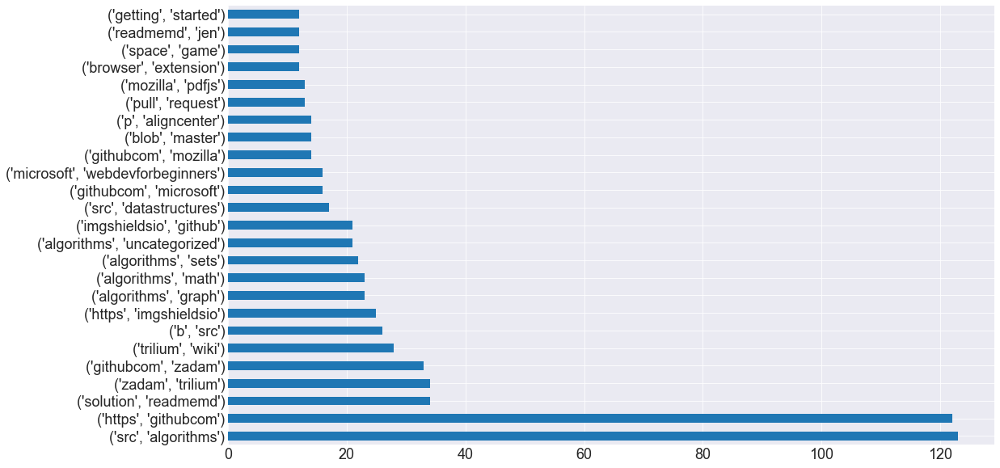

In [97]:
java_bigrams = (pd.Series((nltk.bigrams(java_words.split()))).astype('string'))
java_bigrams.value_counts().head(25).plot.barh()

## HTML Words

<AxesSubplot:>

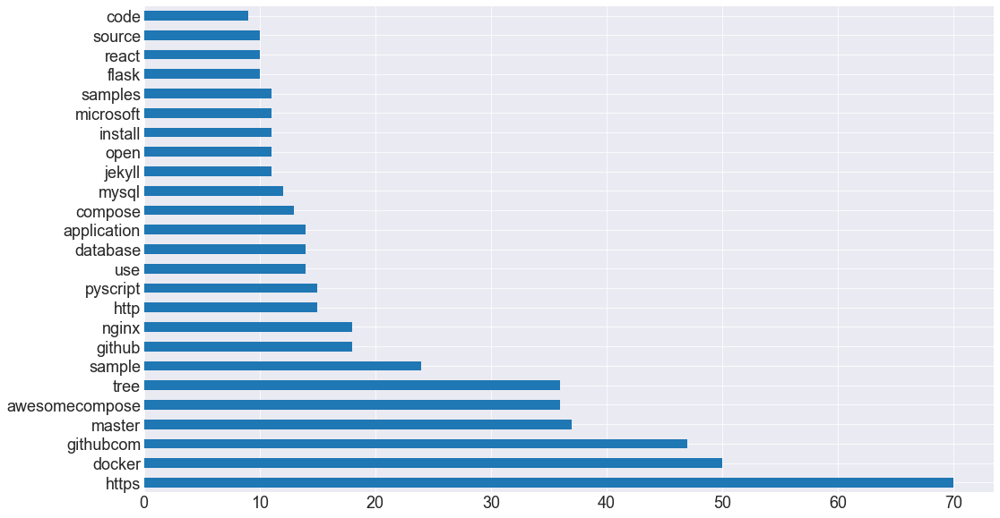

In [98]:
html_freq.head(25).plot.barh()

(-0.5, 799.5, 599.5, -0.5)

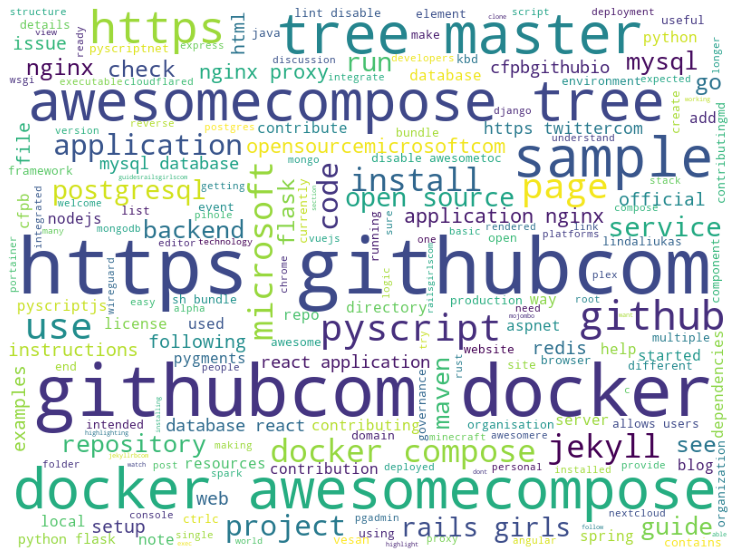

In [99]:
img = WordCloud(background_color='white', width=800, height=600).generate(html_words)
plt.imshow(img)
plt.axis('off')

(-0.5, 799.5, 599.5, -0.5)

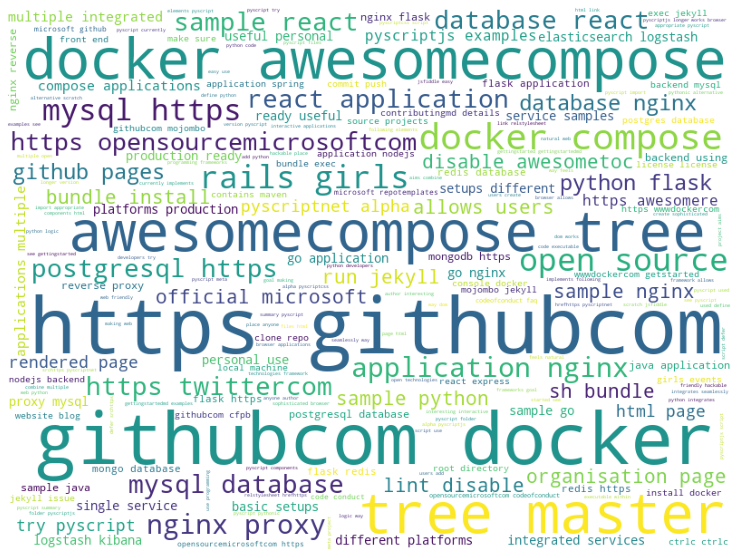

In [100]:
img = WordCloud(background_color='white', width=800, height=600, collocation_threshold=3).generate(html_words)
plt.imshow(img)
plt.axis('off')

<AxesSubplot:>

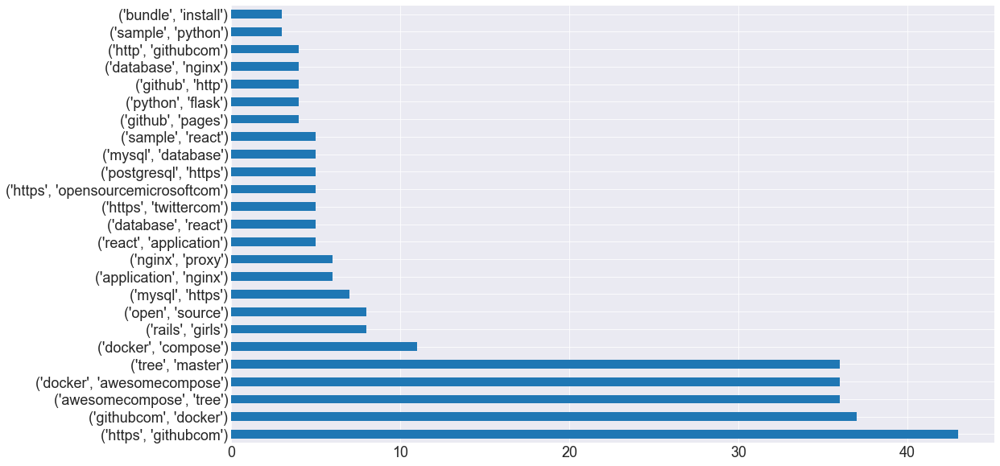

In [101]:
html_bigrams = (pd.Series((nltk.bigrams(html_words.split()))).astype('string'))
html_bigrams.value_counts().head(25).plot.barh()

## TypeScript Words

<AxesSubplot:>

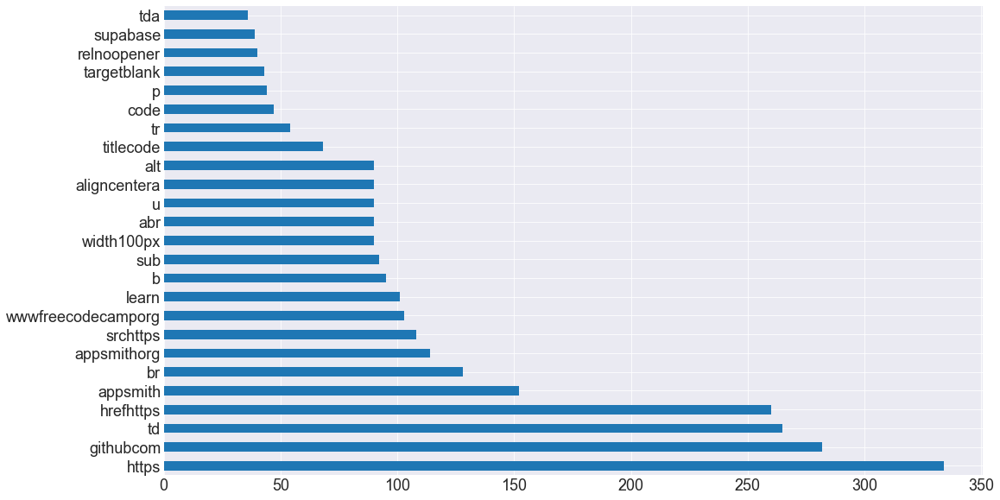

In [102]:
types_freq.head(25).plot.barh()

(-0.5, 799.5, 599.5, -0.5)

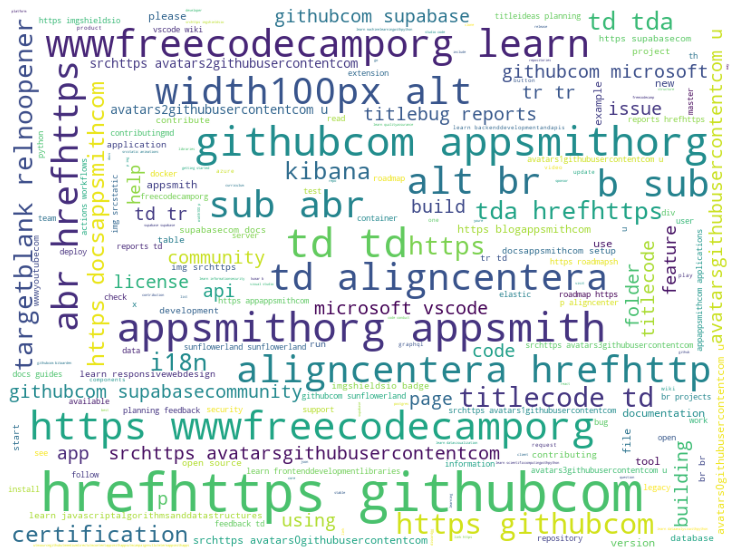

In [103]:
img = WordCloud(background_color='white', width=800, height=600).generate(types_words)
plt.imshow(img)
plt.axis('off')

(-0.5, 799.5, 599.5, -0.5)

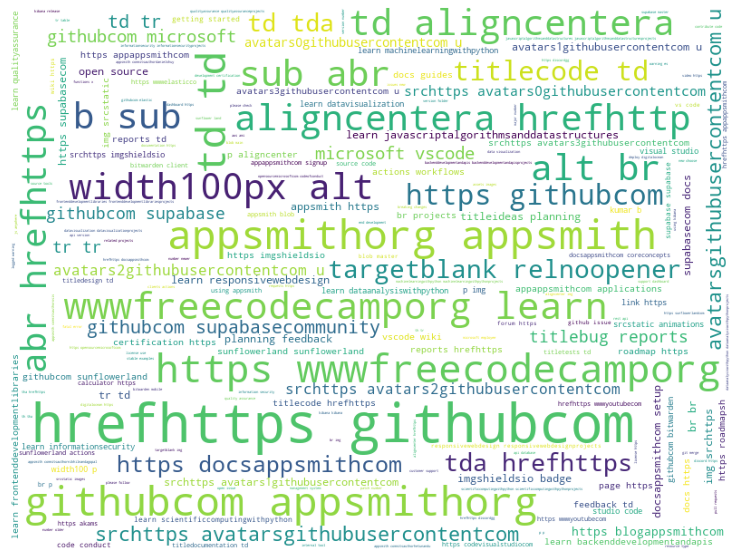

In [104]:
img = WordCloud(background_color='white', width=800, height=600, collocation_threshold=3).generate(types_words)
plt.imshow(img)
plt.axis('off')

<AxesSubplot:>

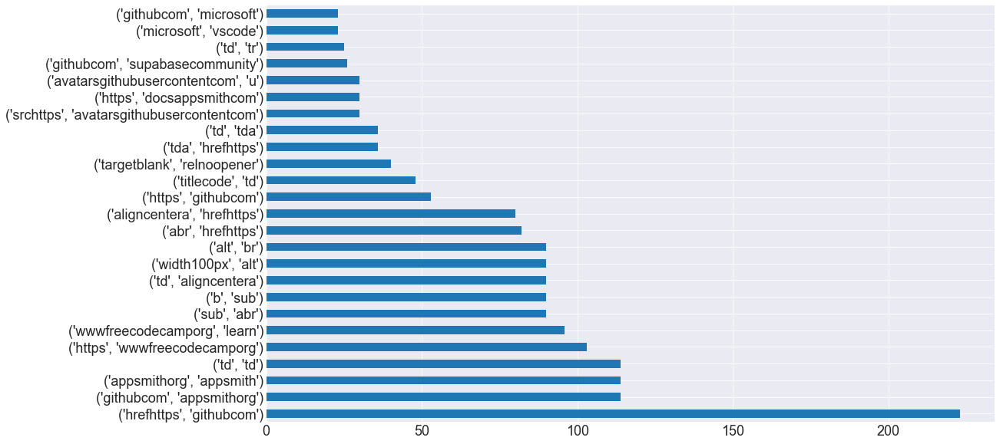

In [105]:
types_bigrams = (pd.Series((nltk.bigrams(types_words.split()))).astype('string'))
types_bigrams.value_counts().head(25).plot.barh()

## CSS Words

<AxesSubplot:>

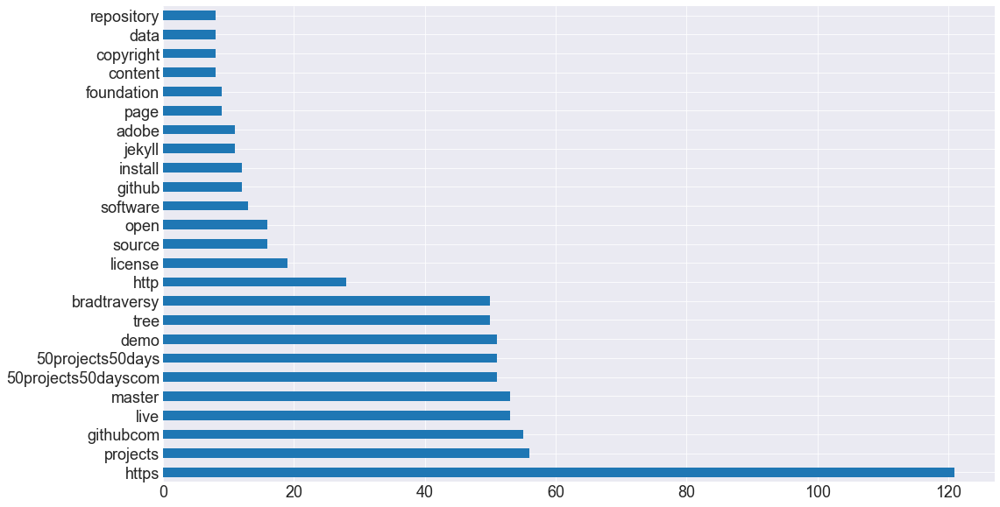

In [106]:
css_freq.head(25).plot.barh()

(-0.5, 799.5, 599.5, -0.5)

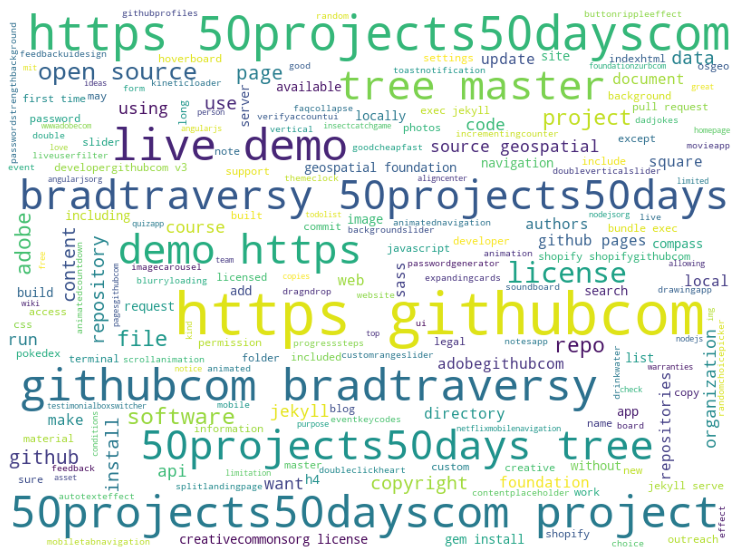

In [107]:
img = WordCloud(background_color='white', width=800, height=600).generate(css_words)
plt.imshow(img)
plt.axis('off')

(-0.5, 799.5, 599.5, -0.5)

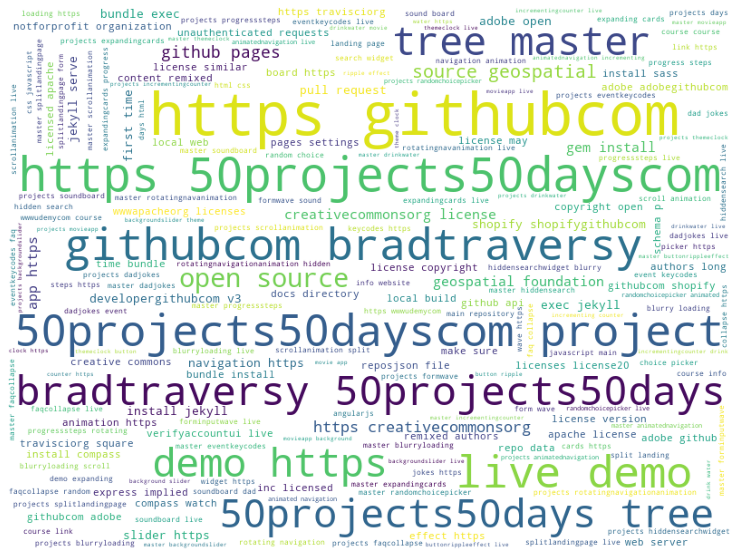

In [108]:
img = WordCloud(background_color='white', width=800, height=600, collocation_threshold=3).generate(css_words)
plt.imshow(img)
plt.axis('off')

<AxesSubplot:>

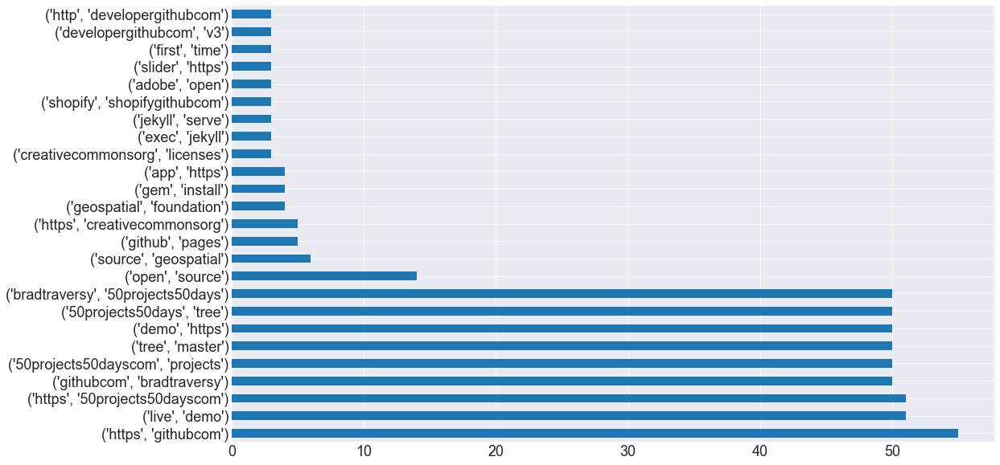

In [109]:
css_bigrams = (pd.Series((nltk.bigrams(css_words.split()))).astype('string'))
css_bigrams.value_counts().head(25).plot.barh()

#### Check the length of the readme

In [110]:
df['message_length'] = df.clean.apply(len)
df['word_count'] = df.clean.apply(str.split).apply(len)
df.head()

,repo,language,original,clean,stemmed,lemmatized,language_reduced,message_length,word_count
0,google/googletest,C++,# GoogleTest\n\n### Announcements\n\n#### Live...,googletest announcements live head googletest ...,googletest announc live head googletest follow...,googletest announcement live head googletest f...,Other,3566,434
1,projectdiscovery/nuclei-templates,Python,"\n\n<h1 align=""center"">\nNuclei Templates\n</h...",h1 aligncenter nuclei templates h1 h4 aligncen...,h1 aligncent nuclei templat h1 h4 aligncenterc...,h1 aligncenter nucleus template h1 h4 aligncen...,Python,3559,378
2,digitalocean/nginxconfig.io,JavaScript,[![GitHub stars](https://img.shields.io/github...,github stars https imgshieldsio github stars d...,github star http imgshieldsio github star digi...,github star http imgshieldsio github star digi...,JavaScript,4622,523
3,flutter/flutter,Dart,# [![Flutter logo][]][flutter.dev]\n\n[![Build...,flutter logo flutterdev build status cirrus bu...,flutter logo flutterdev build statu cirru buil...,flutter logo flutterdev build status cirrus bu...,Other,4717,562
4,PaddlePaddle/PaddleOCR,Python,"English | [简体中文](README_ch.md)\n\n<p align=""ce...",english readmechmd p aligncenter img src doc p...,english readmechmd p aligncent img src doc pad...,english readmechmd p aligncenter img src doc p...,Python,10832,1203


In [111]:
round(df.message_length.mean(),2)

8925.88

In [171]:
df[['language', 'message_length']].sort_values(by='message_length', ascending=False).head(30)

,language,message_length
94,Python,143302
91,None,63021
37,None,50374
10,Python,44832
81,None,41077
83,None,38924
92,Python,35082
93,None,31866
61,Python,31184
79,Assembly,20355


In [112]:
df[['message_length', 'word_count']][df.language == 'Python']

,message_length,word_count
1,3559,378
4,10832,1203
10,44832,5437
11,410,40
17,19839,2428
25,1355,164
35,3559,378
54,339,46
55,2639,309
61,31184,4099


In [113]:
df[['message_length', 'word_count']][df.language == 'JavaScript']

,message_length,word_count
2,4622,523
13,11647,1423
22,4028,510
23,5219,615
27,5245,580
29,9607,1105
33,2607,306
74,1931,247
75,1363,182
87,4426,400


In [114]:
df[['message_length', 'word_count']][df.language == 'HTML']

,message_length,word_count
26,1526,188
39,5626,661
76,1968,265
97,1319,180
98,43,6
102,601,77
106,1415,149
109,0,0
112,25,3
114,0,0


In [115]:
df[['message_length', 'word_count']][df.language == 'TypeScript']

,message_length,word_count
5,9588,1099
12,3155,383
19,2612,338
40,2381,277
42,19196,1870
44,5219,594
56,5878,424
57,19196,1870
78,16006,1344
86,3000,346


In [116]:
df[['message_length', 'word_count']][df.language == 'CSS']

,message_length,word_count
73,8847,963
95,2160,284
100,1744,223
104,1859,246
108,2195,262
110,166,19
111,164,25
113,0,0


## Lemmatized

In [117]:
py_words_l = ' '.join(df[df.language == 'Python'].lemmatized)
java_words_l = ' '.join(df[df.language == 'JavaScript'].lemmatized)
html_words_l = ' '.join(df[df.language == 'HTML'].lemmatized)
types_words_l = ' '.join(df[df.language == 'TypeScript'].lemmatized)
css_words_l = ' '.join(df[df.language == 'CSS'].lemmatized)
all_words_l = ' '.join(df.lemmatized)

In [118]:
py_words_l[:1000]

'h1 aligncenter nucleus template h1 h4 aligncentercommunity curated list template nucleus engine find security vulnerability application h4 p aligncenter hrefhttps githubcom projectdiscovery nucleitemplates issuesimg srchttps imgshieldsio badge contributionswelcomebrightgreensvgstyleflat hrefhttps githubcom projectdiscovery nucleitemplates releasesimg srchttps imgshieldsio github release projectdiscovery nucleitemplates hrefhttps twittercom pdnucleiimg srchttps imgshieldsio twitter follow pdnucleisvglogotwitter hrefhttps discordgg projectdiscoveryimg srchttps imgshieldsio discord 695645237418131507svglogodiscord p p aligncenter hrefhttps nucleiprojectdiscoveryio templatingguide documentation hrefcontributionscontributions hrefdiscussiondiscussion hrefcommunitycommunity hrefhttps nucleiprojectdiscoveryio faq template faq hrefhttps discordgg projectdiscoveryjoin discord p template core nucleus scanner http githubcom projectdiscovery nucleus power actual scanning engine repository store h

In [119]:
java_words_l[:1000]

'github star http imgshieldsio github star digitalocean nginxconfigiosvg http githubcom digitalocean nginxconfigio stargazer github contributor http imgshieldsio github contributor digitalocean nginxconfigiosvgcolorblue http githubcom digitalocean nginxconfigio graph contributor mit license http imgshieldsio github license digitalocean nginxconfigiosvgcolorblue http githubcom digitalocean nginxconfigio blob master license br closed issue http imgshieldsio github issuesclosedraw digitalocean nginxconfigiosvgcolorbrightgreen http githubcom digitalocean nginxconfigio issuesqis3aissueis3aclosed closed pr http imgshieldsio github issuesprclosedraw digitalocean nginxconfigiosvgcolorbrightgreen http githubcom digitalocean nginxconfigio pullsqis3apris3aclosed open issue http imgshieldsio github issuesraw digitalocean nginxconfigiosvg http githubcom digitalocean nginxconfigio issue open pr http imgshieldsio github issuesprraw digitalocean nginxconfigiosvg http githubcom digitalocean nginxconfig

In [120]:
html_words_l[:1000]

'pyscript pyscript summary pyscript pythonic alternative scratch jsfiddle easy use programming framework goal making web friendly hackable place anyone author interesting interactive application get started see gettingstarted gettingstartedmd example see pyscript folder pyscriptjs longer version pyscript meta project aim combine multiple open technology framework allows user create sophisticated browser application python integrates seamlessly way dom work browser allows user add python logic way feel natural web python developer try pyscript try pyscript import appropriate pyscript file html page html link relstylesheet hrefhttps pyscriptnet alpha pyscriptcss script defer srchttps pyscriptnet alpha pyscriptjs script use pyscript component html page pyscript currently implement following element pyscript used define python code executable within web page element rendered page used add logic pyrepl creates repl component rendered page code editor allows user write executable code check 

In [121]:
types_words_l[:1000]

'p aligncenter img width300 srchttps rawgithubusercontentcom supabase supabase master web static supabaselightroundedcornerbackgroundsvg p supabase supabase http supabasecom open source firebase alternative building feature firebase using enterprisegrade open source tool x hosted postgres database doc http supabasecom doc guide database x authentication authorization doc http supabasecom doc guide auth x autogenerated apis x rest doc http supabasecom doc guide apirestapi x realtime subscription doc http supabasecom doc guide apirealtimeapi x graphql beta doc http supabasecom doc guide apigraphqlapi x function x database function doc http supabasecom doc guide database function x edge function doc http supabasecom doc guide function x file storage doc http supabasecom doc guide storage x dashboard supabase dashboard http rawgithubusercontentcom supabase supabase master apps www public image github supabasedashboardpng documentation full documentation visit supabasecom doc http supabasec

In [122]:
css_words_l[:1000]

'50 project 50 day html cs javascript main repository project course course link http wwwudemycom course 50projects50days course info website http 50projects50dayscom project live demo 01 expanding card http githubcom bradtraversy 50projects50days tree master expandingcards live demo http 50projects50dayscom project expandingcards 02 progress step http githubcom bradtraversy 50projects50days tree master progresssteps live demo http 50projects50dayscom project progresssteps 03 rotating navigation animation http githubcom bradtraversy 50projects50days tree master rotatingnavanimation live demo http 50projects50dayscom project rotatingnavigationanimation 04 hidden search widget http githubcom bradtraversy 50projects50days tree master hiddensearch live demo http 50projects50dayscom project hiddensearchwidget 05 blurry loading http githubcom bradtraversy 50projects50days tree master blurryloading live demo http 50projects50dayscom project blurryloading 06 scroll animation http githubcom bra

In [123]:
all_words_l[:1000]

'googletest announcement live head googletest follows abseil live head philosophy http abseilio philosophyupgradesupport recommend updating latest commit main branch often possible http githubcom abseil abseilcpp blob master faqmdwhatisliveatheadandhowdoidoit documentation update documentation live github page http googlegithubio googletest recommend browsing documentation github page rather directly repository release 1110 release 1110 http githubcom google googletest release tag release1110 available coming soon planning take dependency abseil http githubcom abseil abseilcpp documentation improvement planned welcome googletest google c test framework repository merger formerly separate googletest googlemock project closely related make sense maintain release together getting started see googletest user guide http googlegithubio googletest documentation recommend starting googletest primer http googlegithubio googletest primerhtml information building googletest found googletest readm

In [124]:
py_freq_l = pd.Series(py_words_l.split()).value_counts()
java_freq_l = pd.Series(java_words_l.split()).value_counts()
html_freq_l = pd.Series(html_words_l.split()).value_counts()
types_freq_l = pd.Series(types_words_l.split()).value_counts()
css_freq_l = pd.Series(css_words_l.split()).value_counts()
all_freq_l = pd.Series(all_words_l.split()).value_counts()


In [125]:
py_freq_l

http                     2415
yes                      1734
unknown                   913
detail                    856
api                       596
                         ... 
wwwvarnishcacheorg          1
varnish                     1
q6z24lapng                  1
sqlvsnosqldifferences       1
yandexweather               1
Length: 9523, dtype: int64

In [126]:
java_freq_l

http         348
src          158
algorithm    135
githubcom    130
readmemd      84
            ... 
stage          1
multiple       1
builtin        1
minimal        1
file2          1
Length: 2334, dtype: int64

In [127]:
html_freq_l

http                  85
docker                50
githubcom             47
master                37
awesomecompose        36
                      ..
author                 1
interesting            1
railsgirlsgithubio     1
cd                     1
didi                   1
Length: 580, dtype: int64

In [128]:
types_freq_l

http          339
githubcom     282
td            265
hrefhttps     260
appsmith      152
             ... 
document        1
cover           1
authorized      1
broadcast       1
detail          1
Length: 2088, dtype: int64

In [129]:
css_freq_l

http          149
project        63
githubcom      55
live           53
master         53
             ... 
popularity      1
last            1
push            1
select          1
need            1
Length: 804, dtype: int64

In [130]:
all_freq_l

http          6769
githubcom     2299
yes           1764
unknown        914
detail         895
              ... 
answered         1
rfcs             1
brainstorm       1
wgpu             1
didi             1
Length: 23584, dtype: int64

In [131]:
word_counts_l = pd.concat([py_freq_l, java_freq_l, html_freq_l, types_freq_l, css_freq_l, all_freq_l], axis=1).fillna(0).astype(int)
word_counts_l.columns = ['python', 'java', 'html', 'typescript', 'css', 'all']

In [132]:
word_counts_l

,python,java,html,typescript,css,all
http,2415,348,85,339,149,6769
yes,1734,2,0,0,0,1764
unknown,913,0,0,0,0,914
detail,856,4,3,1,0,895
api,596,16,0,21,6,724
...,...,...,...,...,...,...
subreddit,0,0,0,0,0,1
answered,0,0,0,0,0,1
rfcs,0,0,0,0,0,1
brainstorm,0,0,0,0,0,1


In [133]:
word_counts_l.sort_values('python', ascending=False).head(25)

,python,java,html,typescript,css,all
http,2415,348,85,339,149,6769
yes,1734,2,0,0,0,1764
unknown,913,0,0,0,0,914
detail,856,4,3,1,0,895
api,596,16,0,21,6,724
apikey,595,0,0,0,0,595
b,455,81,0,95,1,753
summarybrb,400,0,0,0,0,400
doc,395,22,1,30,2,596
data,376,32,0,14,8,627


In [134]:
word_counts_l.sort_values('java', ascending=False).head(25)

,python,java,html,typescript,css,all
http,2415,348,85,339,149,6769
src,13,158,0,3,0,215
algorithm,18,135,0,4,0,180
githubcom,306,130,47,282,55,2299
readmemd,55,84,1,3,1,216
b,455,81,0,95,1,753
github,25,76,18,15,12,280
serverless,0,54,0,0,0,66
terrad,0,49,0,0,0,49
set,14,42,1,5,1,131


In [135]:
word_counts_l.sort_values('html', ascending=False).head(25)

,python,java,html,typescript,css,all
http,2415,348,85,339,149,6769
docker,28,5,50,10,0,156
githubcom,306,130,47,282,55,2299
master,103,19,37,16,53,355
tree,111,14,36,1,50,288
awesomecompose,0,0,36,0,0,36
sample,5,2,35,2,0,60
application,17,17,20,23,0,185
github,25,76,18,15,12,280
nginx,3,12,18,0,0,37


In [136]:
word_counts_l.sort_values('typescript', ascending=False).head(25)

,python,java,html,typescript,css,all
http,2415,348,85,339,149,6769
githubcom,306,130,47,282,55,2299
td,52,0,0,265,0,330
hrefhttps,68,29,1,260,0,430
appsmith,0,0,0,152,0,156
br,99,13,0,128,0,535
appsmithorg,0,0,0,114,0,116
srchttps,45,10,1,108,1,236
wwwfreecodecamporg,0,0,0,103,0,105
learn,6,41,1,101,1,229


In [137]:
word_counts_l.sort_values('css', ascending=False).head(25)

,python,java,html,typescript,css,all
http,2415,348,85,339,149,6769
project,41,33,9,26,63,485
githubcom,306,130,47,282,55,2299
master,103,19,37,16,53,355
live,13,1,0,2,53,79
demo,6,2,0,2,51,69
50projects50days,0,0,0,0,51,51
50projects50dayscom,0,0,0,0,51,51
bradtraversy,0,0,0,0,50,50
tree,111,14,36,1,50,288


In [138]:
# set up some basic matplotlib style parameters
plt.rc('figure', figsize=(17, 10))
plt.style.use('seaborn-darkgrid')

Text(0.5, 1.0, 'Top 25 Most Frequent Overall lemmatized Words')

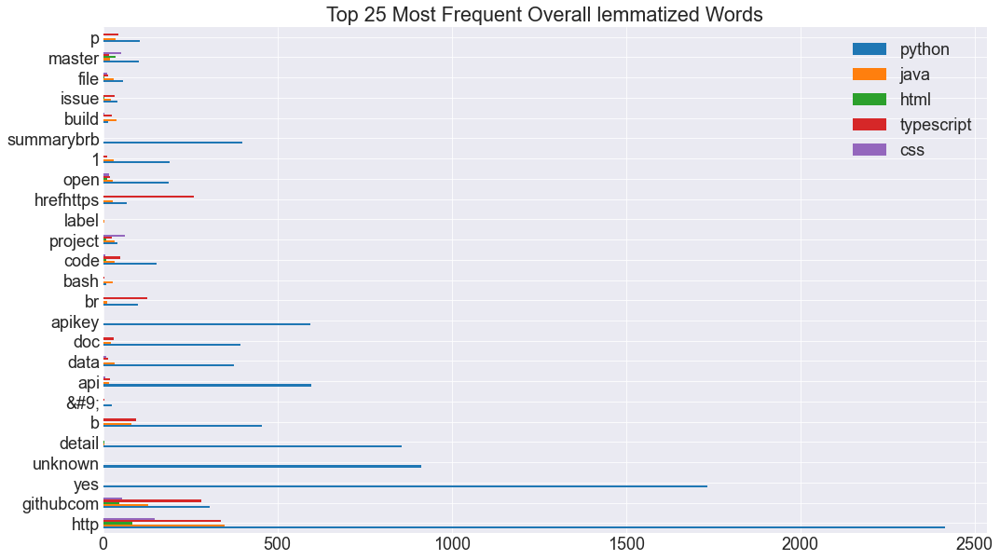

In [139]:
plt.rc('font', size=18)
word_counts_l.sort_values('all', ascending=False).head(25)[['python', 'java', 'html', 'typescript', 'css']].plot.barh()
plt.title('Top 25 Most Frequent Overall lemmatized Words')

## Lemmatized Python words

<AxesSubplot:>

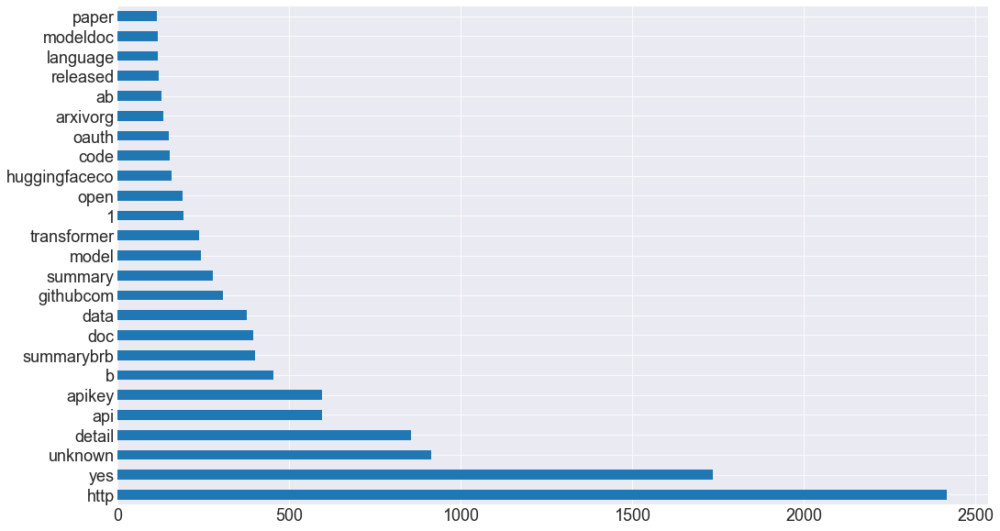

In [140]:
py_freq_l.head(25).plot.barh()

(-0.5, 799.5, 599.5, -0.5)

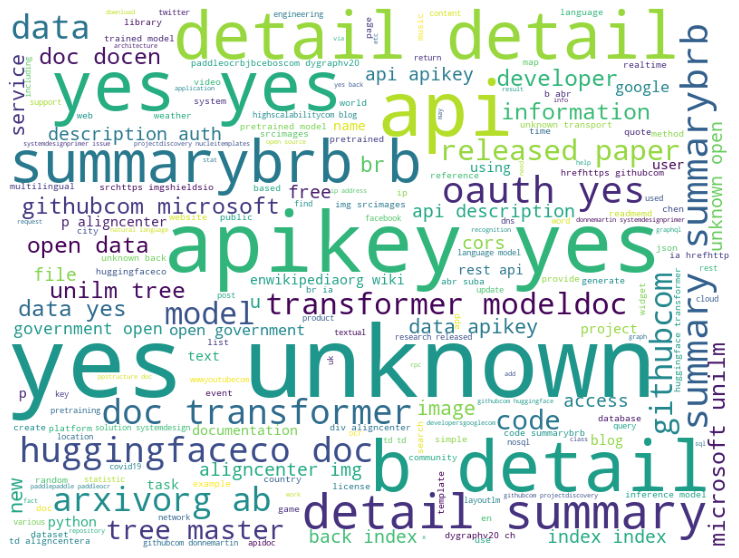

In [141]:
img = WordCloud(background_color='white', width=800, height=600).generate(py_words_l)
plt.imshow(img)
plt.axis('off')

(-0.5, 799.5, 599.5, -0.5)

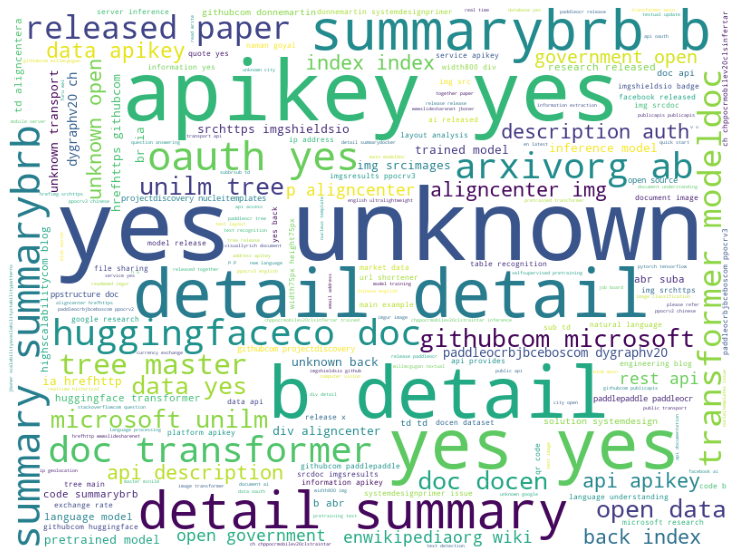

In [142]:
img = WordCloud(background_color='white', width=800, height=600, collocation_threshold=3).generate(py_words_l)
plt.imshow(img)
plt.axis('off')

<AxesSubplot:>

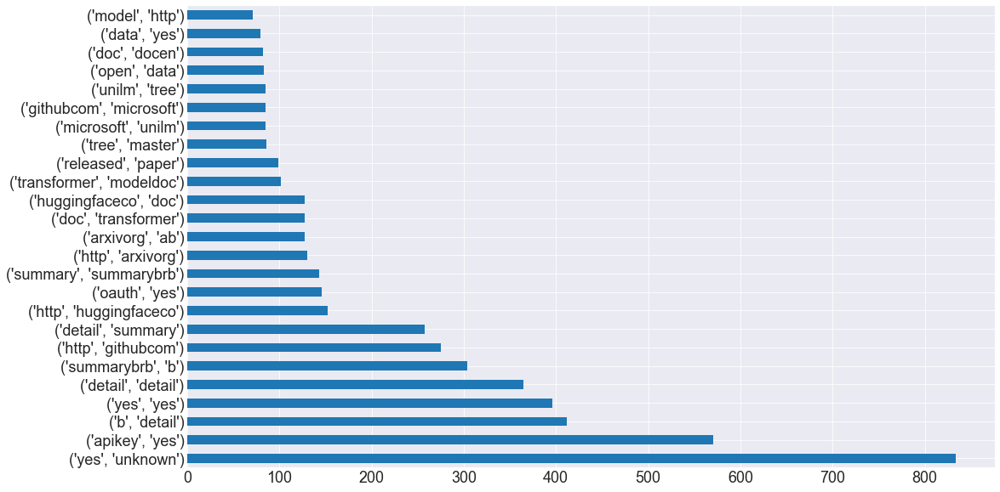

In [143]:
py_bigrams_l = (pd.Series((nltk.bigrams(py_words_l.split()))).astype('string'))
py_bigrams_l.value_counts().head(25).plot.barh()

## Lemmatized JavaScript Words

<AxesSubplot:>

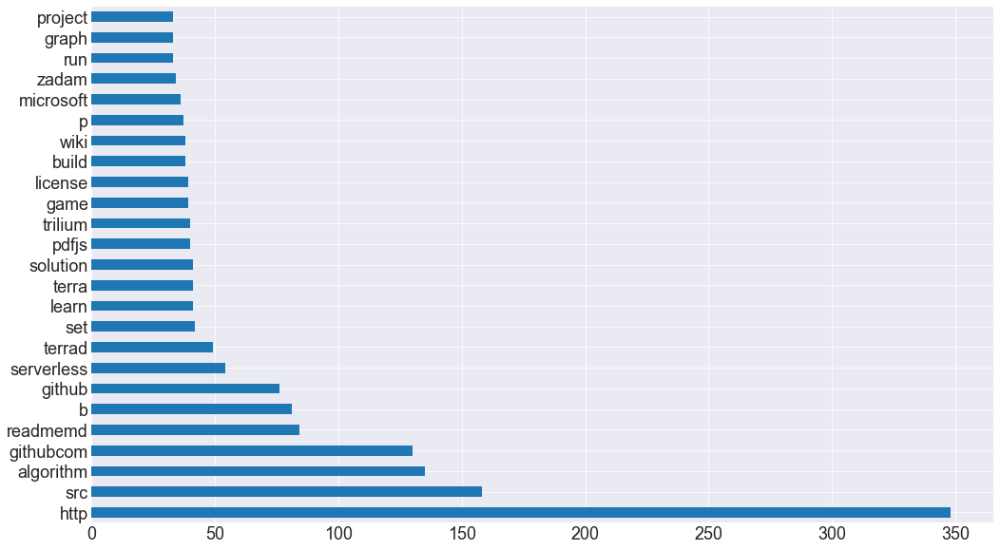

In [144]:
java_freq_l.head(25).plot.barh()

(-0.5, 799.5, 599.5, -0.5)

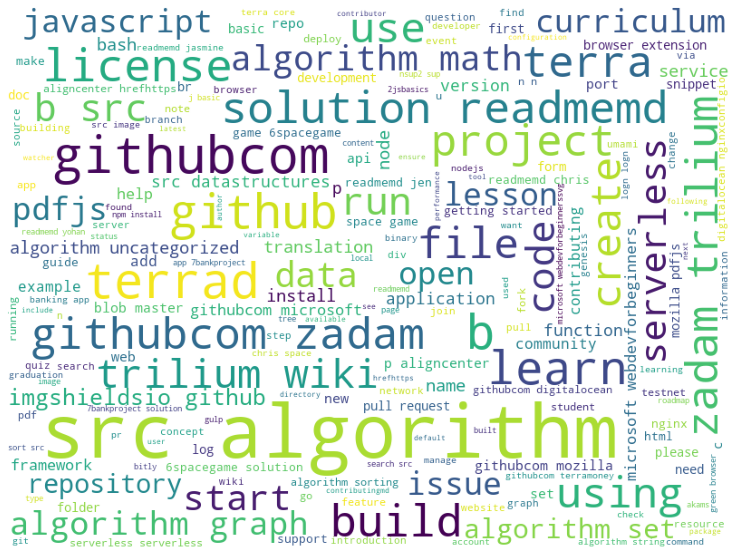

In [145]:
img = WordCloud(background_color='white', width=800, height=600).generate(java_words_l)
plt.imshow(img)
plt.axis('off')

(-0.5, 799.5, 599.5, -0.5)

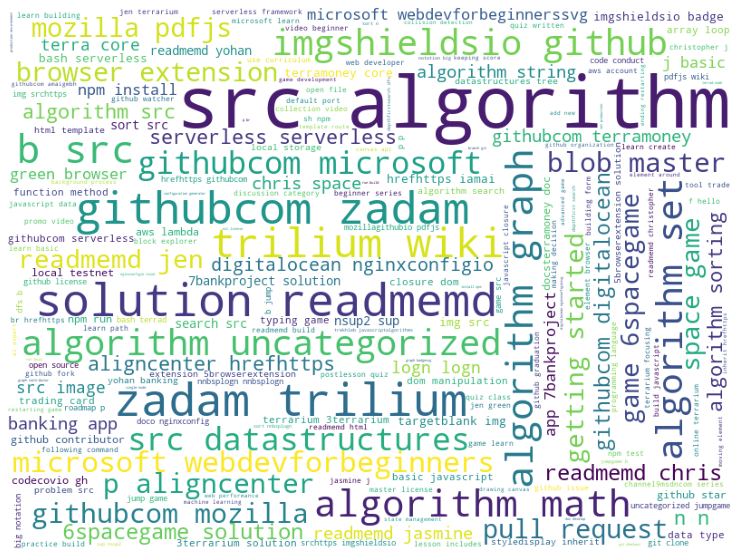

In [146]:
img = WordCloud(background_color='white', width=800, height=600, collocation_threshold=3).generate(java_words_l)
plt.imshow(img)
plt.axis('off')

<AxesSubplot:>

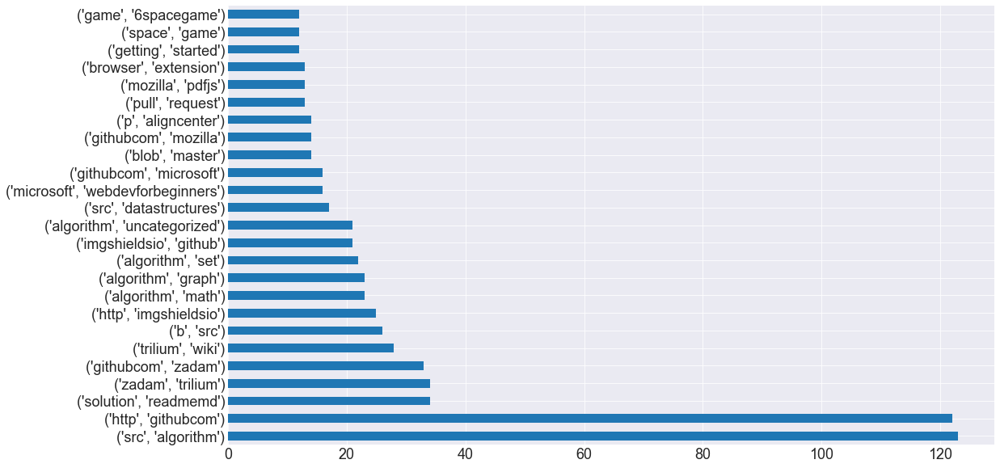

In [147]:
java_bigrams_l = (pd.Series((nltk.bigrams(java_words_l.split()))).astype('string'))
java_bigrams_l.value_counts().head(25).plot.barh()

## Lemmatized HTML Words

<AxesSubplot:>

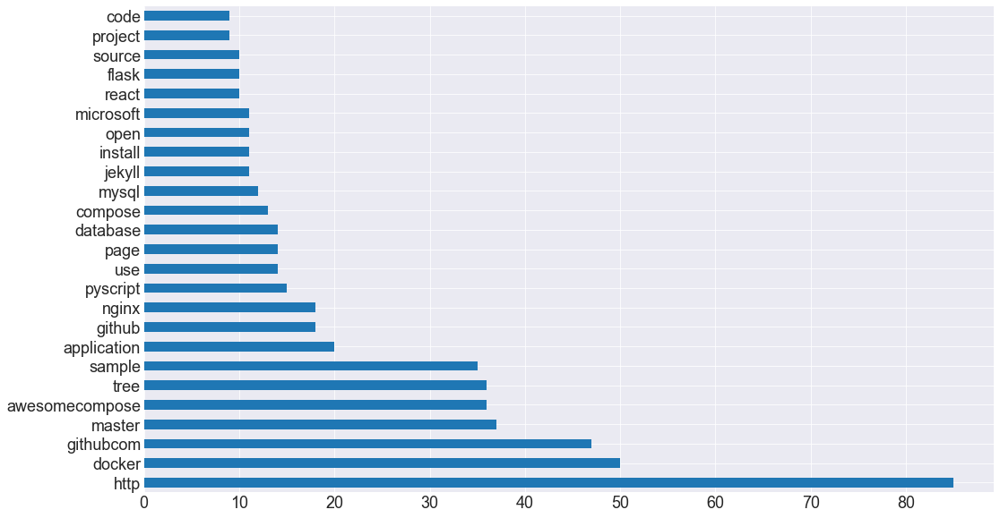

In [148]:
html_freq_l.head(25).plot.barh()

(-0.5, 799.5, 599.5, -0.5)

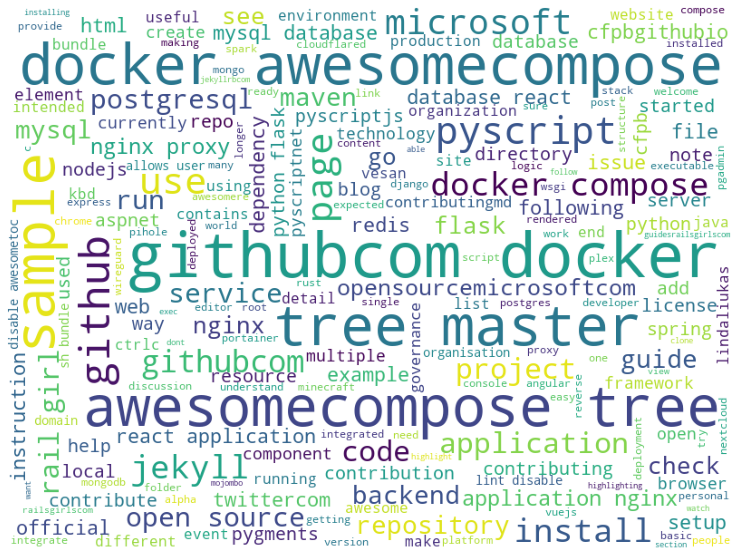

In [149]:
img = WordCloud(background_color='white', width=800, height=600).generate(html_words_l)
plt.imshow(img)
plt.axis('off')

(-0.5, 799.5, 599.5, -0.5)

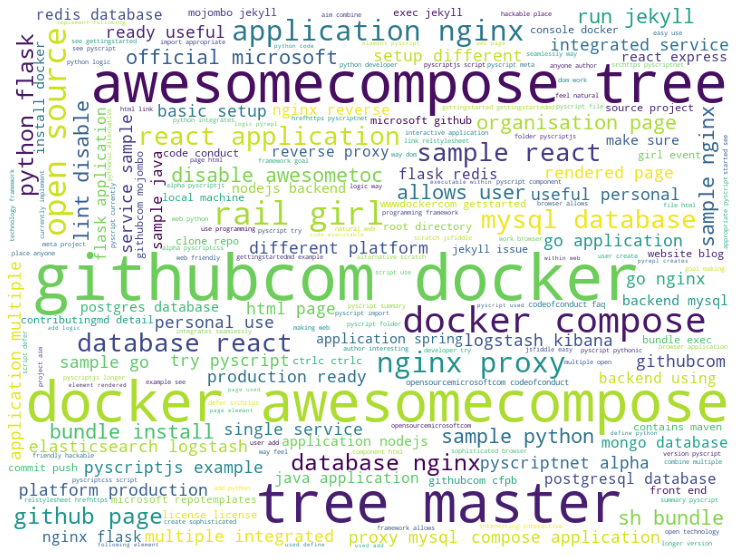

In [150]:
img = WordCloud(background_color='white', width=800, height=600, collocation_threshold=3).generate(html_words_l)
plt.imshow(img)
plt.axis('off')

<AxesSubplot:>

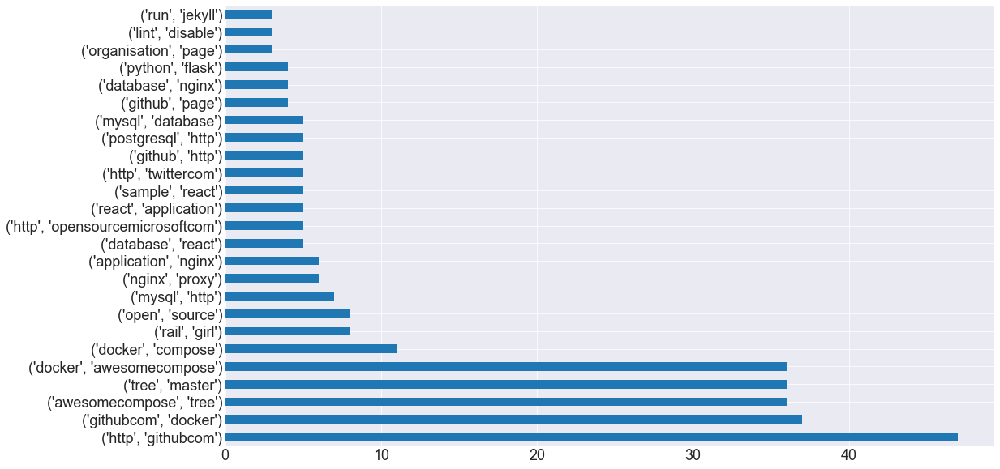

In [151]:
html_bigrams_l = (pd.Series((nltk.bigrams(html_words_l.split()))).astype('string'))
html_bigrams_l.value_counts().head(25).plot.barh()

## Lemmatized TypeScript Words

<AxesSubplot:>

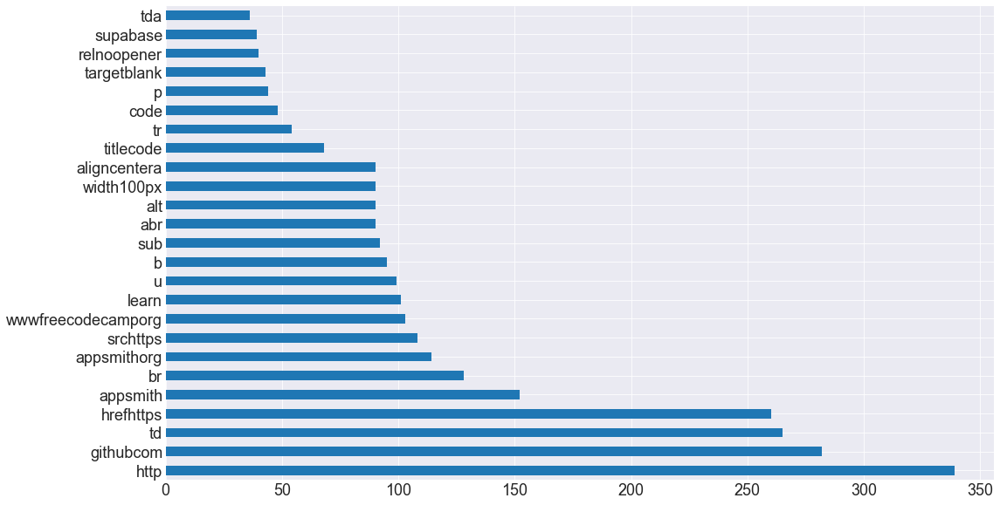

In [152]:
types_freq_l.head(25).plot.barh()

(-0.5, 799.5, 599.5, -0.5)

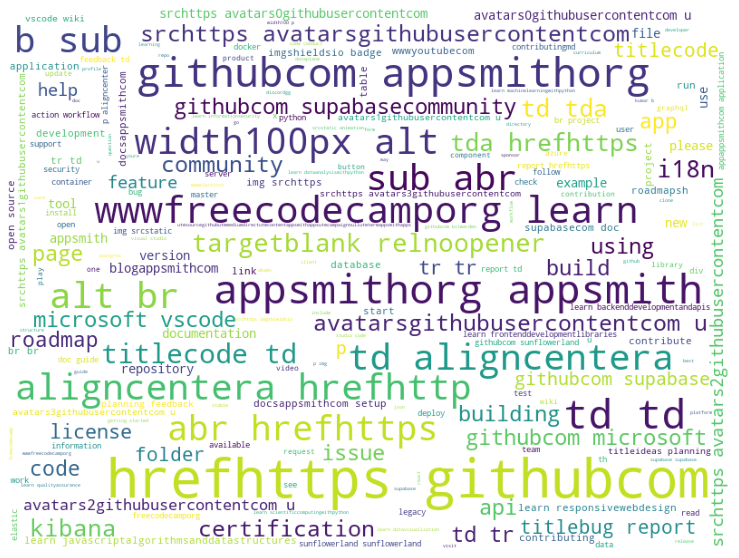

In [153]:
img = WordCloud(background_color='white', width=800, height=600).generate(types_words_l)
plt.imshow(img)
plt.axis('off')

(-0.5, 799.5, 599.5, -0.5)

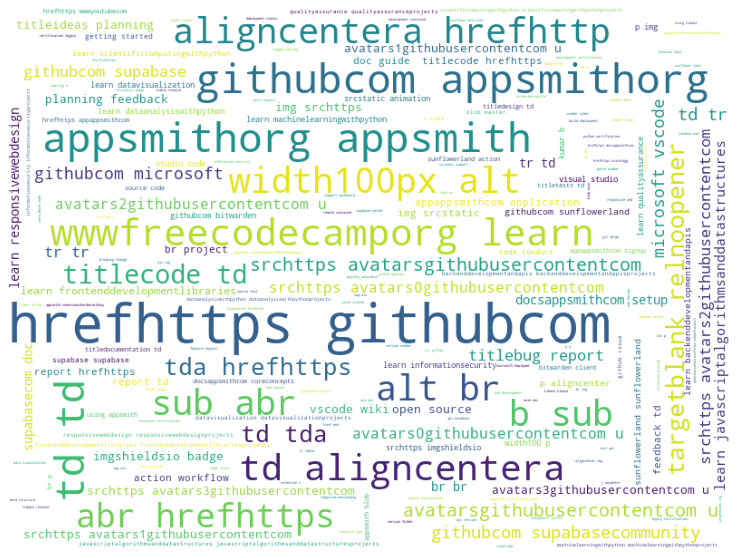

In [154]:
img = WordCloud(background_color='white', width=800, height=600, collocation_threshold=3).generate(types_words_l)
plt.imshow(img)
plt.axis('off')

<AxesSubplot:>

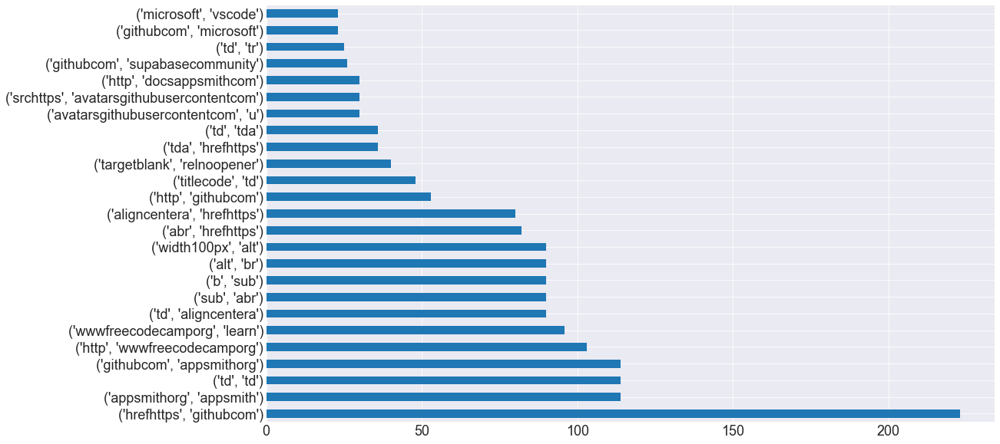

In [155]:
types_bigrams_l = (pd.Series((nltk.bigrams(types_words_l.split()))).astype('string'))
types_bigrams_l.value_counts().head(25).plot.barh()

## CSS Words

<AxesSubplot:>

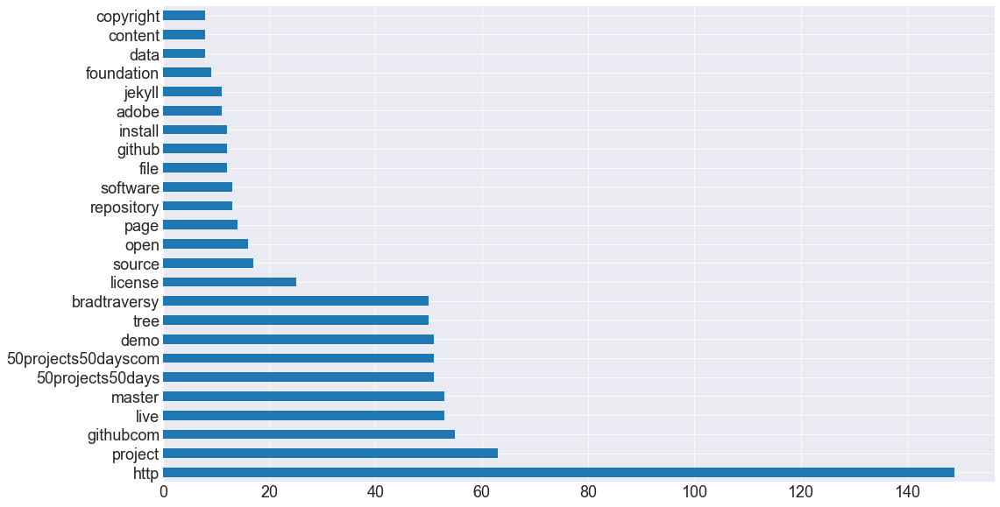

In [156]:
css_freq_l.head(25).plot.barh()

(-0.5, 799.5, 599.5, -0.5)

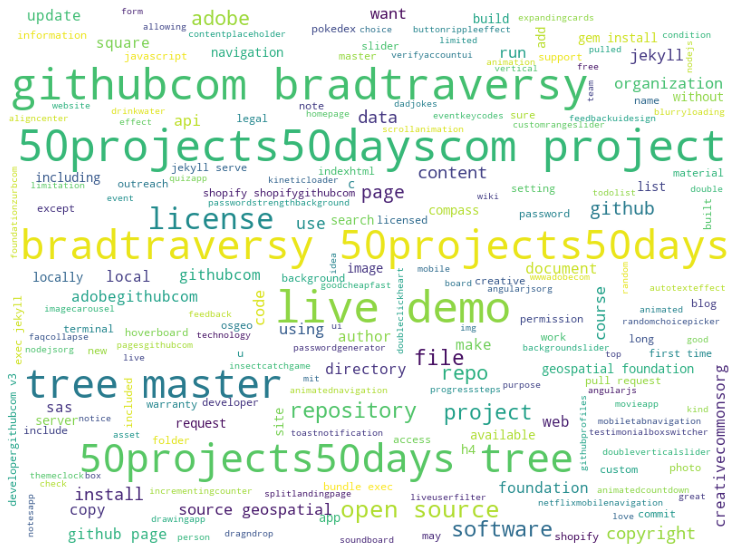

In [157]:
img = WordCloud(background_color='white', width=800, height=600).generate(css_words_l)
plt.imshow(img)
plt.axis('off')

(-0.5, 799.5, 599.5, -0.5)

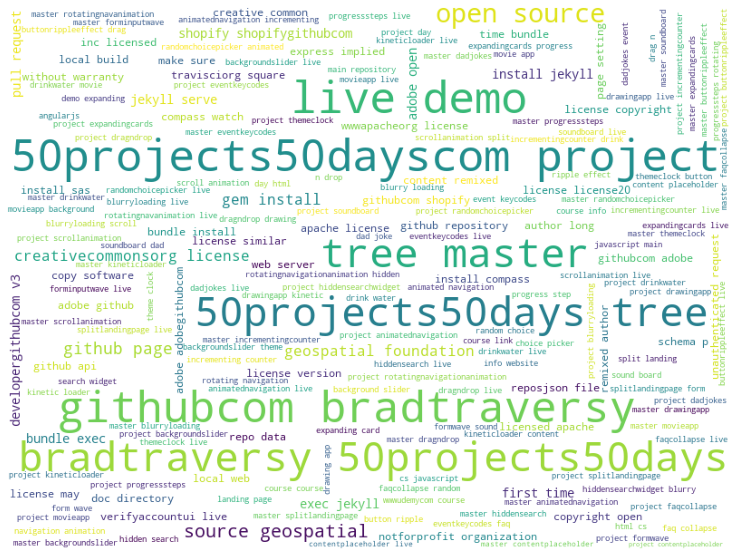

In [158]:
img = WordCloud(background_color='white', width=800, height=600, collocation_threshold=3).generate(css_words_l)
plt.imshow(img)
plt.axis('off')

<AxesSubplot:>

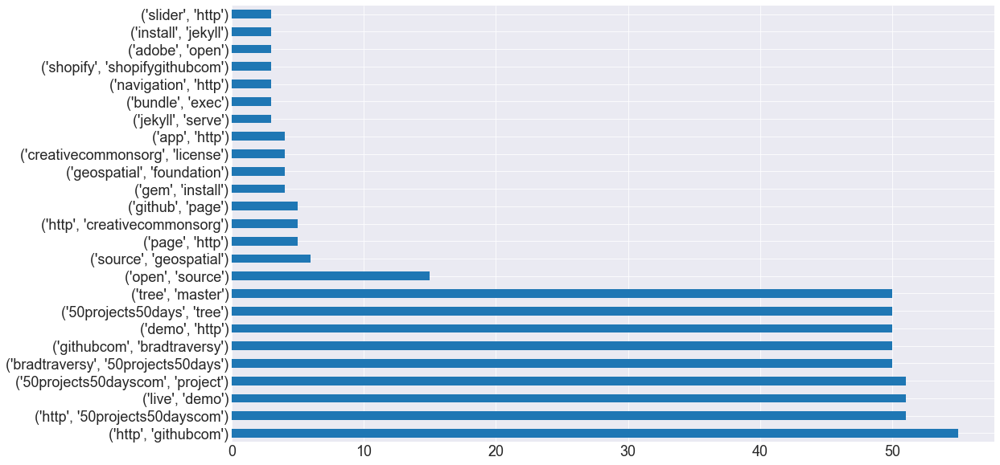

In [159]:
css_bigrams_l = (pd.Series((nltk.bigrams(css_words_l.split()))).astype('string'))
css_bigrams_l.value_counts().head(25).plot.barh()